Advanced Lane Line Detection - Udacity Self-Driving Car NanoDegree
===

By: Todd Farr 

---

This notebook contains all the code requirements for the Advanced Lane Line Detection Project for Term 1 of the Self-Driving Car Nanodegree from Udacity. 

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

<div id='toc'></div> 

## Table Of Contents 

* Section 1 - [Camera Calibration](#section1) 
* Section 2 - [Building the Pipeline](#section2) 
  * Section 2.1 - [Undistorting The Image](#section21) 
  * Section 2.2 - [Perspective Warping](#section22) 
  * Section 2.3 - [Gradient Thresholding](#section23)
  * Section 2.4 - [Color Space Thresholding](#section24) 
  * Section 2.5 - [Combined Thresholding](#section25) 
  * Section 2.6 - [Combining Warping and Image Thresholding](#section26) 
  * Section 2.7 - [Finding Lane Lines](#section27) 
    * Section 2.7.1 - [Histogram to Baseline Sliding Window Search](#section271)
    * Section 2.7.2 - [Creating the Line Class](#section272)
    * Section 2.7.3 - [Brute Force Sliding Window Search](#section273)
    * Section 2.7.4 - [Fit From Previous Fit](#section274)
    * Section 2.7.5 - [Lane Line Overlay Information](#section275)
* Section 3 - [It's the Final Pipeline...do da do do... do da do do doooo](#section3)

In [1]:
# imports 
import os
import cv2
import glob 
import pickle
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip

%matplotlib inline 

<div id='section1'></div> 

## Section 1: Camera Calibration

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

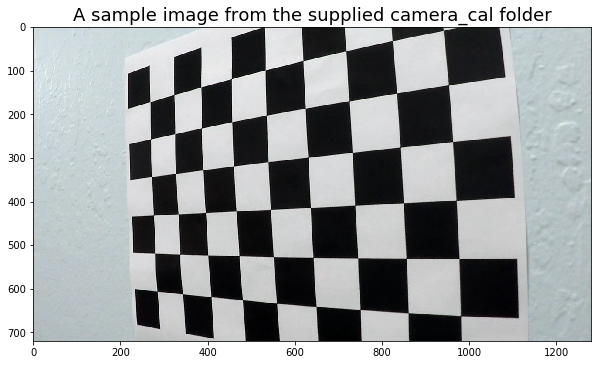

In [2]:
# Create a list containing all the camera calibration images 
camera_calibration_images = glob.glob('camera_cal/calibration*.jpg') 

# get a list of all the calibration images and view a sample image  
sample_calibration_img = cv2.imread(random.choice(camera_calibration_images))
plt.figure(figsize=(10, 10))
plt.title('A sample image from the supplied camera_cal folder', fontsize=18)
plt.imshow(sample_calibration_img)
plt.show()

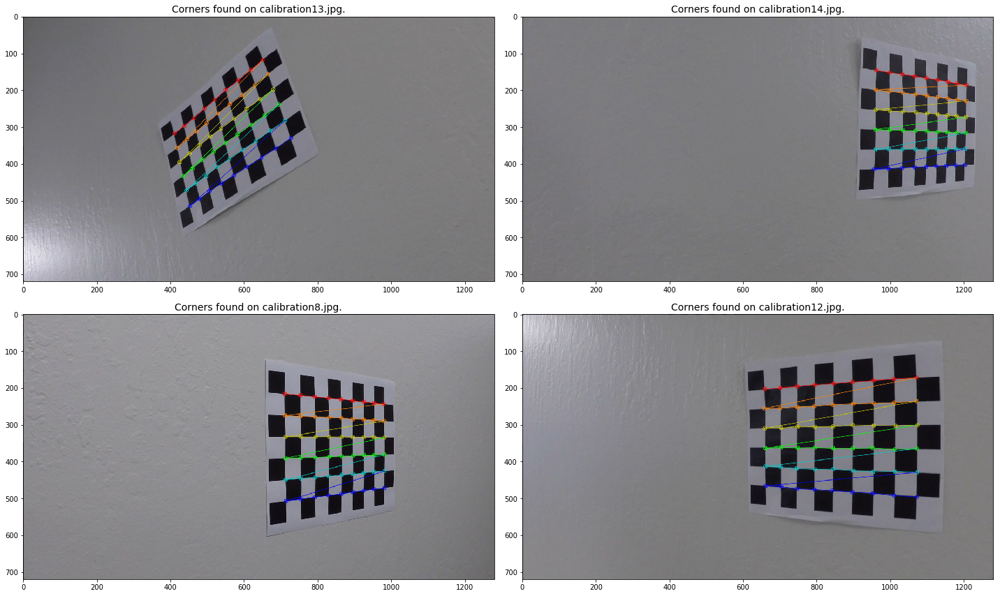

In [3]:
# Some useful variables 
chess_rows, chess_cols = (6, 9)
plot_rows, plot_cols = (2, 2)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chess_rows*chess_cols, 3), np.float32)
objp[:,:2] = np.mgrid[0:chess_cols, 0:chess_rows].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Step through the list and search for chessboard corners and save resulting images
for fname in camera_calibration_images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (chess_cols, chess_rows), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (chess_cols, chess_rows), corners, ret)
        write_name = './corners_found/' + fname.split('/')[1]
        # Create directory if doesn't exist.
        os.makedirs(os.path.dirname(write_name), exist_ok=True)  
        # Save image
        cv2.imwrite(write_name, img)

# Create a list containing all the image paths for corner images
corner_images = glob.glob('corners_found/calibration*.jpg')

# Setup the matplotlib figure, flatten for single digit indexing and slice to # of images 
f, axes = plt.subplots(nrows=plot_rows, ncols=plot_cols, squeeze=False, figsize=(20, 12))
axes_list = axes.flatten()

# choose and display 4 random images to check the findChessboardCorners functionality
for ax in axes_list:
    random_img_path = random.choice(corner_images)
    img = cv2.imread(random_img_path)
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV reads BGR matplotlib displays as RGB
    ax.set_title("Corners found on {}.".format(random_img_path.split('/')[1]), fontsize=14)
    ax.imshow(rgb_img)
    
# final plot formatting
plt.tight_layout()
plt.show()

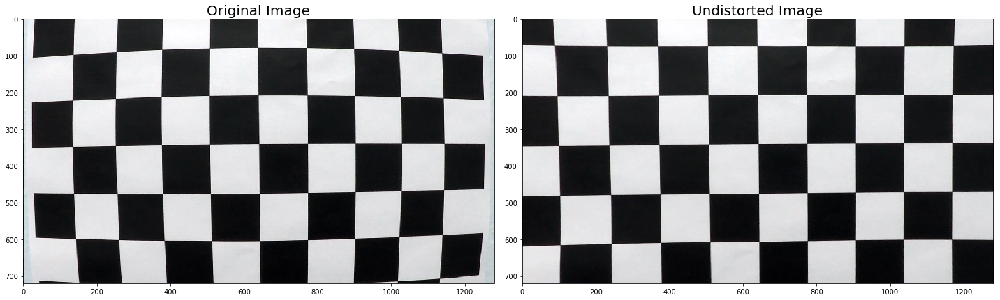

In [4]:
# test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg',dst)

# Save the camera calibration result for later use (don't need to worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("camera_cal/camera_calibration.p", "wb" ))

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=20)
plt.tight_layout()
plt.show()

<div id="section2"></div>

## Section 2: Building the Pipeline 

---- 

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

<div id="section21"></div> 

### 2.1 Undistorting the image

---
Using a camera calibration matrix and a vector of distortion coefficents the <strong>undistort_image</strong> function can return an undistorted image taken from the same camera that the matrix and vectors where created from. 

---

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [5]:
def undistort_image(img, mtx, dist):
    """Undistorts a provided image
    
    Keyword Arguments: 
    img -- the image to undistort
    mtx   -- Camera Calibration Matrix (mtx) 
    dist  -- A vector of distortion coefficents (dist).
    """
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist 

def bgr_2_rgb(img):
    """Ecapsulating cvtColor for a handy converstion to RGB."""
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def rgb_2_gray(img):
    """Ecapsulating cvtColor for a handy converstion to grayscale."""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def bgr_2_hls(img):
    """Ecapsulating cvtColor for a handy converstion to HLS."""
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

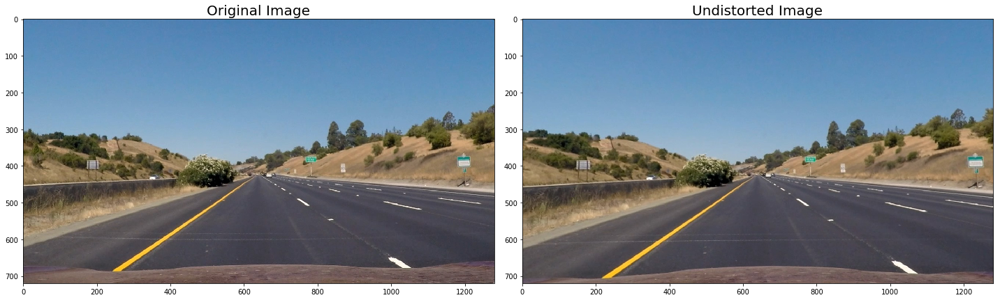

In [6]:
# Testing the undistorted image function on a test image. 
dist_pickle = pickle.load(open("./camera_cal/camera_calibration.p", "rb"))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']
test_img = cv2.imread('./test_images/straight_lines1.jpg')
test_undist = undistort_image(test_img, mtx, dist)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(bgr_2_rgb(test_img))
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(bgr_2_rgb(test_undist))
ax2.set_title('Undistorted Image', fontsize=20)
plt.tight_layout()
plt.show()

<div id="section22"></div>

### 2.2 Bird's Eye Warping (Perspective Warping)

---

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [7]:
def draw_polylines(img, pts, color=(255, 99, 71)): 
    """A function to draw polylines on an image"""
    pts = np.array(pts)
    cv2.polylines(warp_test_img, np.int32([pts]), True, color, thickness=2)


def get_warp_pts(img):
    """A function to return src and dst points based off image size.
    These points and offsets are empircally selected. """
    # some useful variables 
    img_height, img_width, _ = img.shape
    x_offset = 440
    bottom_offset = 170
    top_offset = 220
    
    # src points (bl --> Bottom Left, tr --> Top Right, etc.)
    src_bl = [img_width/2 - x_offset, img_height]
    src_br = [img_width/2 + x_offset, img_height]
    src_tr = [700, 460]
    src_tl = [580, 460]
    src = np.float32([src_bl, src_br, src_tr, src_tl])
    
    # dst points (bl --> Bottom Left, tr --> Top Right, etc.)
    dst_bl = [src_bl[0] + bottom_offset, img_height]
    dst_br = [src_br[0] - bottom_offset, img_height]
    dst_tr = [src_tr[0] + top_offset, 0]
    dst_tl = [src_tl[0] - top_offset, 0]
    dst = np.float32([dst_bl, dst_br, dst_tr, dst_tl])
    
    return src, dst 

    
def birdseye_warp(img, src, dst):
    """A function to warp an image to a birdeye view
    
    Keyword Arguments: 
    img  -- the undistorted image to warp
    src  -- the source points 
    dst  -- the destination points 
    """
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped 

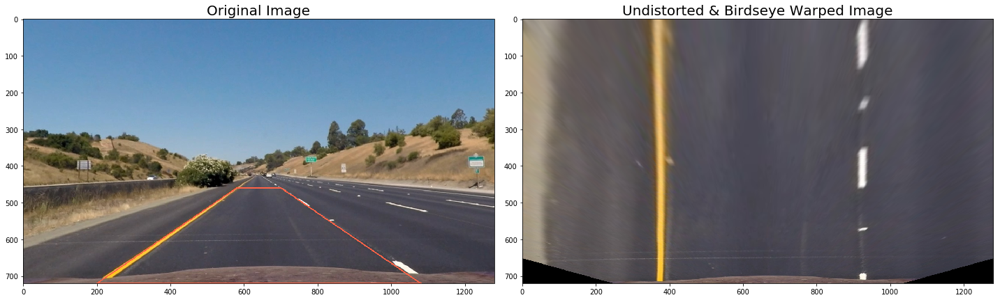

In [8]:
# setup the original masked zone points for image warping 
warp_test_img = bgr_2_rgb(undistort_image(cv2.imread('./test_images/straight_lines1.jpg'), mtx, dist))
copy = warp_test_img.copy()

src, dst = get_warp_pts(copy)
draw_polylines(warp_test_img, src)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(warp_test_img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(birdseye_warp(copy, src, dst))
ax2.set_title('Undistorted & Birdseye Warped Image', fontsize=20)
plt.tight_layout()
plt.show()

<div id="section23"></div> 

### 2.3 Gradient Thresholding  

----
<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [9]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    """A function for Absolute Sobel Thresholding."""
    gray = rgb_2_gray(img)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output


def directional_thresh(img, ksize=3, thresh_min=0, thresh_max=np.pi/2):
    """A function for directional Sobel Thresholding."""
    gray = rgb_2_gray(img)
    abs_sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize))
    abs_sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize))
    direction = np.absolute(np.arctan2(abs_sobel_y, abs_sobel_x))
    mask = np.zeros_like(direction)
    mask[(direction >= thresh_min) & (direction <= thresh_max)] = 1

    return mask

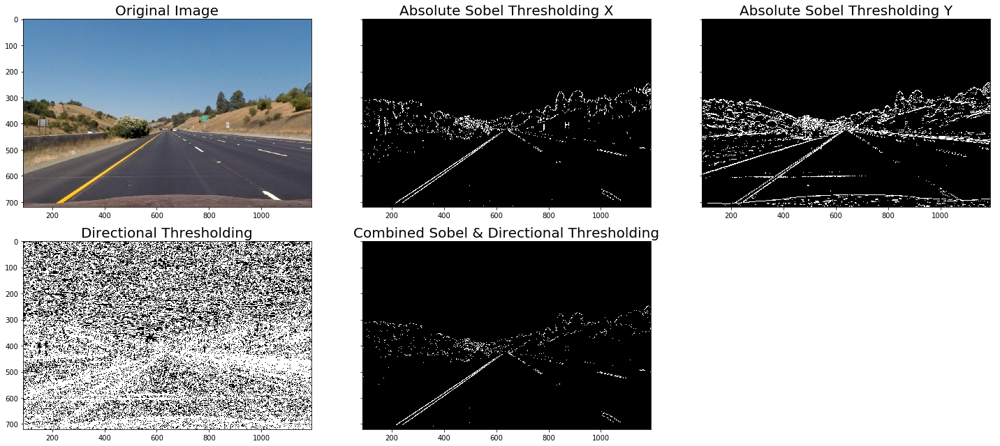

In [10]:
# Testing the sobel thresholding function  
f, axes = plt.subplots(2, 3, figsize=(20, 9), sharey=True)
axes = axes.flatten()

axes[0].imshow(copy)
axes[0].set_title('Original Image', fontsize=20)

axes[1].set_title('Absolute Sobel Thresholding X', fontsize=20)
axes[1].imshow(abs_sobel_thresh(copy, thresh_min=30, thresh_max=100), cmap='gray')

axes[2].set_title('Absolute Sobel Thresholding Y', fontsize=20)
axes[2].imshow(abs_sobel_thresh(copy, orient='y', thresh_min=20, thresh_max=100), cmap='gray')

axes[3].set_title('Directional Thresholding', fontsize=20)
axes[3].imshow(directional_thresh(copy, thresh_min=np.pi/6), cmap='gray')

axes[4].set_title('Combined Sobel & Directional Thresholding', fontsize=20)
axes[4].imshow((directional_thresh(copy, thresh_min=np.pi/6) == 1) & 
               (abs_sobel_thresh(copy, thresh_min=30, thresh_max=100) == 1), cmap='gray')

axes[5].axis('off')

plt.tight_layout()
plt.show()

<div id="section24"></div> 

### 2.4 Color Space Thresholding 

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

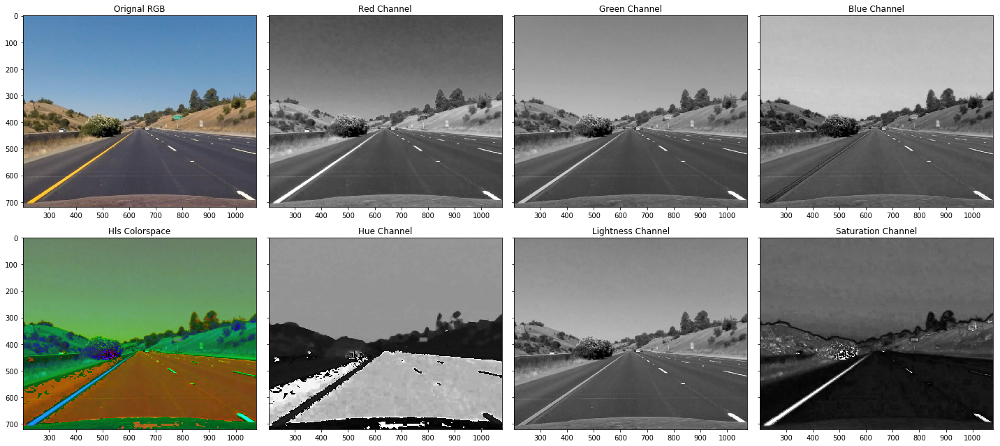

In [11]:
# examining color spaces and usable channels 
f, axes = plt.subplots(2, 4, figsize=(20, 9), sharey=True)

color_test_rgb = copy.copy()
color_test_hls = cv2.cvtColor(color_test_rgb, cv2.COLOR_RGB2HLS)

titles = [['Orignal RGB', 'Red Channel', 'Green Channel', 'Blue Channel'],
         ['Hls Colorspace', 'Hue Channel', 'Lightness Channel', 'Saturation Channel']]
for i, img in enumerate([color_test_rgb, color_test_hls]):
    for j in range(4):
        axes[i, j].set_title(titles[i][j])
        if j > 0:
            axes[i, j].imshow(img[:, :, j-1], cmap=plt.cm.gray)
        else:
            axes[i, j].imshow(img)

plt.tight_layout()
plt.show()

### From the tests above Red, Green, Lightness and Saturation seem like the most useful color channels.

---
Let's test for all test images which represent a number of changing conditions

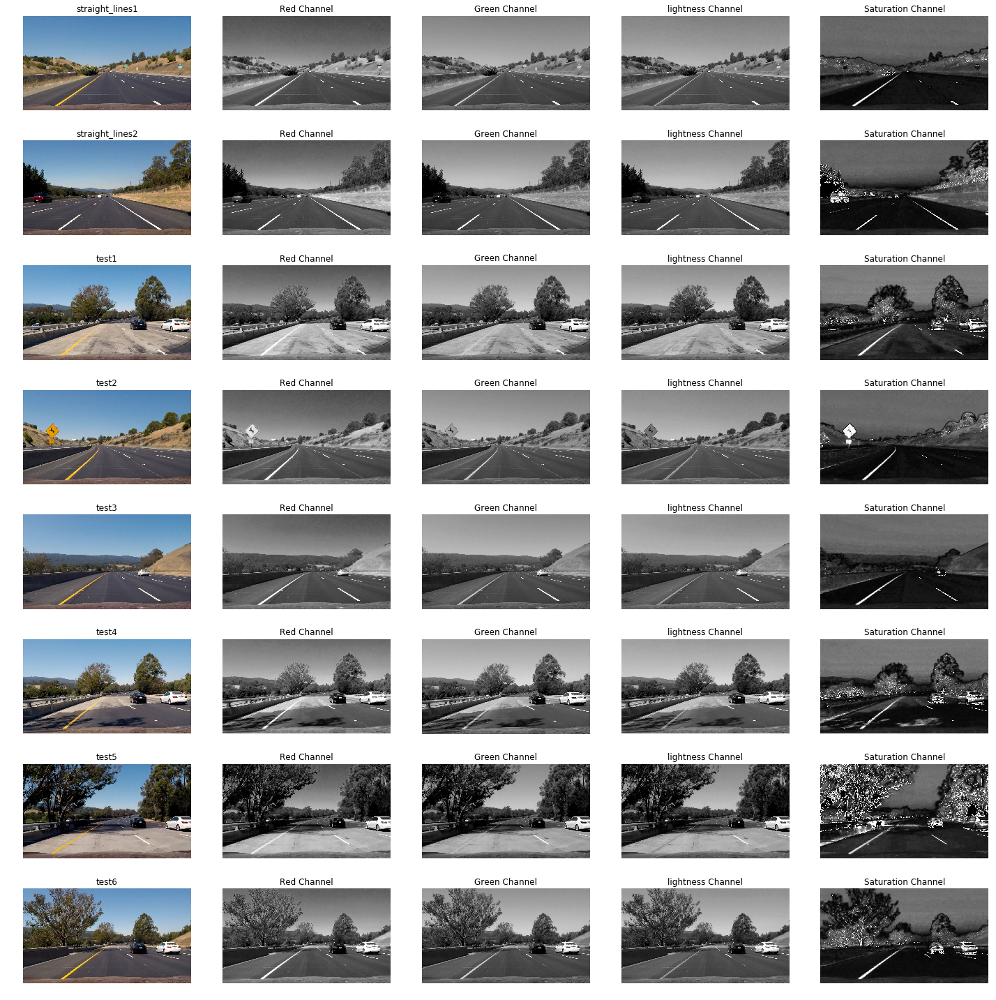

In [12]:
# R&G and L&S look like the most usable channels, let's test on all test images. 
test_images = glob.glob('test_images/*.jpg')
n_rows = len(test_images)

# setup the figure 
f, axes = plt.subplots(n_rows, 5, figsize=(20, 20))

for row, img in enumerate(test_images):
    test_img = cv2.imread(img)
    for col, channel in enumerate(['o', 'r', 'g', 'l', 's']):
        if channel == 'o':
            axes[row, col].set_title(img.split('/')[1].split('.')[0])
            axes[row, col].imshow(bgr_2_rgb(test_img))
        elif channel == 'r':
            axes[row, col].set_title('Red Channel')
            axes[row, col].imshow(bgr_2_rgb(test_img)[:,:,0], cmap=plt.cm.gray)
        elif channel == 'g':
            axes[row, col].set_title('Green Channel')
            axes[row, col].imshow(bgr_2_rgb(test_img)[:,:,1], cmap=plt.cm.gray)
        elif channel == 'l':
            axes[row, col].set_title('lightness Channel')
            axes[row, col].imshow(bgr_2_hls(test_img)[:,:,1], cmap=plt.cm.gray)
        elif channel == 's':
            axes[row, col].set_title('Saturation Channel')
            axes[row, col].imshow(bgr_2_hls(test_img)[:,:,2], cmap=plt.cm.gray)
        
        axes[row, col].axis('off')
        
plt.tight_layout()
plt.show()

<div id="section25"></div> 

### 2.5 Combined Thresholding 

----
<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [13]:
# functions for color space thresholding 
def thresh_color_channels(img, threshes=[100, 100], channels=[0, 1], colorspace='RGB'):
    """A function for thresholding in the RGB Color Space.
    
    Keyword Arguments: 
    img        -- this function assumes the image is loaded by OpenCV in BGR format
    thresh_min -- the minimum threshold for combined and returned pixels (0, 255)
    channels   -- which channels to threshold and return
    colorspace -- which color space 'RGB' or 'HLS' 
    """
    if colorspace == 'RGB':
        thresh_img = bgr_2_rgb(img)
    elif colorspace == 'HLS':
        thresh_img = bgr_2_hls(img)
    
    channels_thresh = []
    for i, c in enumerate(channels): 
        channels_thresh.append(thresh_img[:,:,c] > threshes[i])

    return channels_thresh


def combined_thresholding(img):
    """A function for combining thresholds.
    
    Keyword Arguments: 
    img -- this function assumes the image is loaded by OpenCV in BGR format
    """
    combined_thresh = np.zeros_like(img[:, :, 0])
    R, G = thresh_color_channels(img, threshes=[150, 150])
    L, S = thresh_color_channels(img, threshes=[100, 120], channels=[1, 2], colorspace='HLS')
    gradients = ((directional_thresh(img, thresh_min=np.pi/6) == 1) & 
                 (abs_sobel_thresh(img, thresh_min=30, thresh_max=100) == 1))
    
    combined_thresh[(R | G & L) & (S | gradients)] = 1
    return combined_thresh

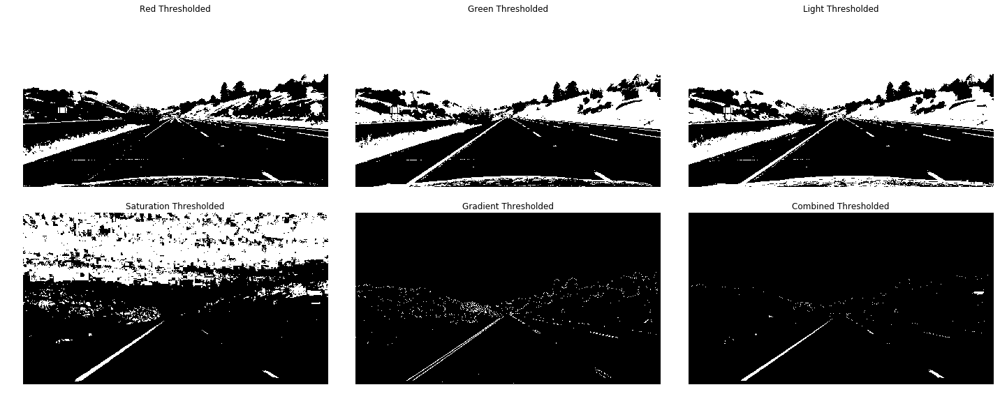

In [14]:
# Check thresholding on a single image 
R, G = thresh_color_channels(copy)
L, S = thresh_color_channels(copy, channels=[1, 2], colorspace='HLS')
grad = ((directional_thresh(copy, thresh_min=np.pi/6) == 1) & 
              (abs_sobel_thresh(copy, thresh_min=30, thresh_max=100) == 1)) 

combined_thresh = combined_thresholding(copy)

f, axes = plt.subplots(2, 3, figsize=(20, 8))
axes = axes.flatten()
channels = ['Red', 'Green', 'Light', 'Saturation', 'Gradient', 'Combined']
[axes[i].axis('off') for i in range(len(axes))]
[axes[i].set_title('{} Thresholded'.format(c)) for i, c in enumerate(channels)]
axes[0].imshow(R, cmap=plt.cm.gray)
axes[1].imshow(G, cmap=plt.cm.gray)
axes[2].imshow(L, cmap=plt.cm.gray)
axes[3].imshow(S, cmap=plt.cm.gray)
axes[4].imshow(grad, cmap=plt.cm.gray)
axes[5].imshow(combined_thresh, cmap=plt.cm.gray)
plt.tight_layout()
plt.show()

<div id="section26"></div> 

### 2.6 Combining Warping and Image Thresholding

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

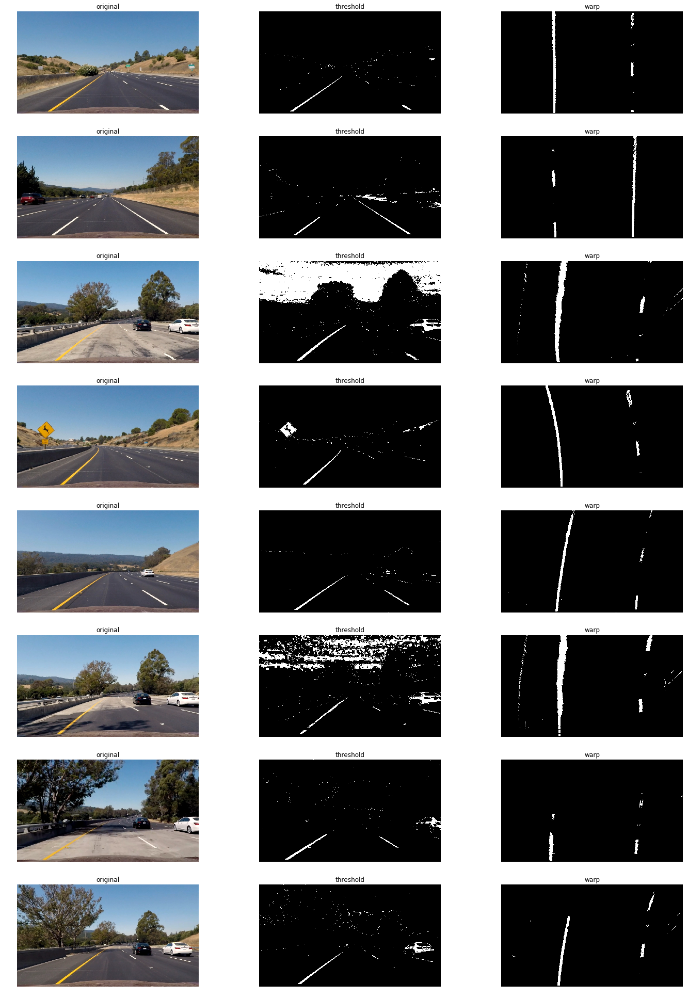

In [15]:
# R&G and L&S look like the most usable channels, let's test on all test images. 
test_images = glob.glob('test_images/*.jpg')
n_rows = len(test_images)

# load in the camera calibration information
dist_pickle = pickle.load(open("./camera_cal/camera_calibration.p", "rb"))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']

# setup the figure 
f, axes = plt.subplots(n_rows, 3, figsize=(20, 27))

# loop through and show 
for row, img in enumerate(test_images):
    test_img = cv2.imread(img)
    undist_img = bgr_2_rgb(undistort_image(test_img, mtx, dist))
    thresh_img = combined_thresholding(undist_img)
    src, dst = get_warp_pts(undist_img)
    warped = birdseye_warp(thresh_img, src, dst)
    
    for col, display in enumerate(['original', 'threshold', 'warp']):
        if display == 'original':
            axes[row, col].imshow(undist_img) 
        if display == 'threshold':
            axes[row, col].imshow(thresh_img, cmap=plt.cm.gray)
        if display == 'warp':
            axes[row, col].imshow(warped, cmap=plt.cm.gray)
        axes[row, col].set_title(display) 
        axes[row, col].axis('off')
        
plt.tight_layout()
plt.show()

<div id="section27"></div> 

### 2.7 Finding the Lane Lines

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

<div id='section271'></div> 

#### 2.7.1 Histogram to Baseline Sliding Window Search 

--- 

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

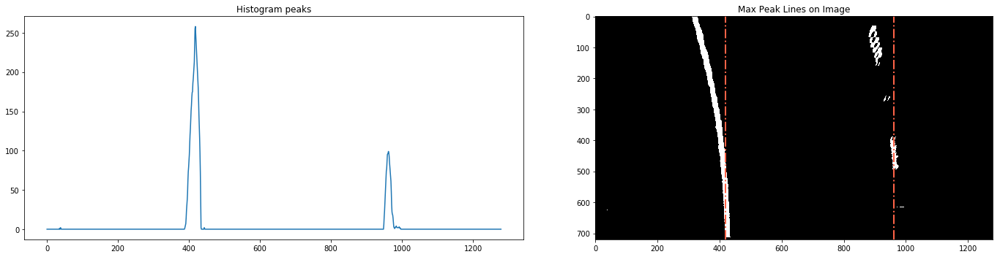

In [16]:
# load in a test image 
hist_img = bgr_2_rgb(undistort_image(cv2.imread(test_images[3]), mtx, dist))
h, w, _ = hist_img.shape 

# preprocess image 
hist_thresh_img = combined_thresholding(hist_img)
src, dst = get_warp_pts(hist_img)
hist_warped = birdseye_warp(hist_thresh_img, src, dst)
hist_sum = np.sum(hist_warped[int(h/2):, :], axis=0) 

# find the max on each half of the image
center = int(w/2)
max_left = np.argmax(hist_sum[:center])
max_right = np.argmax(hist_sum[center:]) + center 

# plot the sum of the columns of the bottom half of the image 
f, axes = plt.subplots(1, 2, figsize=(20, 5))
axes[0].set_title('Histogram peaks')
axes[0].plot(np.sum(hist_warped[h//2:, :], axis=0))
axes[1].set_title('Max Peak Lines on Image')
axes[1].imshow(hist_warped, cmap=plt.cm.gray)
axes[1].axvline(max_left, color='tomato', ls='dashdot', lw='2')
axes[1].axvline(max_right, color='tomato', ls='dashdot', lw='2')
plt.tight_layout()
plt.show()

<div id='section272'></div>

#### 2.7.2 Creating a Line Class to store useful Lane Line Information 

---

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [17]:
# A Line Class to keep track of useful parameters for each line 
class Line():
    def __init__(self, n=10):
        self.n = n                                    # number of fits to average 
        self.detected = False                         # was the line detected in the last iteration?
        self.recent_xfitted = []                      # x values of the last n fits of the line
        self.bestx = None                             # avg x values of the fitted line over the last n iters  
        self.recent_fits = []                         # poly coeffs from the last fits over n iters
        self.best_fit = None                          # poly coeffs averaged over the last n iters
        self.current_fit = [np.array([False])]        # polynomial coefficients for the most recent fit
        self.radius_of_curvature = None               # radius of curvature of the line in some units
        self.line_base_pos = None                     # distance in meters of vehicle center from the line
        self.diffs = np.array([0,0,0], dtype='float') # difference in fit coefficients between last and new fits
        self.allx = None                              # x values for detected line pixels
        self.ally = None                              # y values for detected line pixels
     
    
    def update_line(self, x, y):
        """Updates the Line Object"""
        self.allx = x
        self.ally = y
        self.detected = True
        self.current_fit = self.polyfit_line(self.allx, self.ally)
        if len(self.recent_xfitted) > self.n: 
            self.recent_xfitted.pop(0)
        self.recent_xfitted.append(self.create_xfit_array())
        self.bestx = np.mean(self.recent_xfitted, axis=0)
        if len(self.recent_fits) > self.n:
            self.recent_fits.pop(0)
        self.recent_fits.append(self.current_fit)
        self.best_fit = np.mean(self.recent_fits, axis=0)
        self.radius_of_curvature = self.calc_rad_ness()
        self.line_base_pos = self.calc_off_center()
        if len(self.recent_fits) > 1:
            self.diffs = self.recent_fits[-1] - self.recent_fits[-2]
    
    
    def polyfit_line(self, x, y, order=2):
        """Fit a "order"ed polynmial to a set of x, y indicies"""
        fit = np.polyfit(y, x, order)
        
        return fit
    

    def create_xfit_array(self, img_height=720):
        """Create the xfit_array"""   
        ploty = np.linspace(0, img_height-1, img_height)
        fitx = self.current_fit[0]*ploty**2 + self.current_fit[1]*ploty + self.current_fit[2]
    
        return fitx  
    
    
    def calc_rad_ness(self, meters_per_pix_y=30/720, meters_per_pix_x=3.7/700, img_height=720):
        """Calculates the 'rad'-ness... actually the radius of curvature in km"""
        y = np.linspace(0, img_height-1, img_height)
        y_eval = np.max(y)
        fit_curve = np.polyfit(y*meters_per_pix_y, self.recent_xfitted[-1]*meters_per_pix_x, 2)
        curve_rad = (((1 + (2*fit_curve[0]*y_eval*meters_per_pix_y + fit_curve[1])**2)**1.5) \
            / np.absolute(2*fit_curve[0])) / 1000 

        return curve_rad 
    
    
    def calc_off_center(self, meters_per_pix_x=3.7/700, img_width=1280):
        """Calculates the offset from center of the Line Object."""
        lane_loc = self.recent_xfitted[-1][-1]  
        center_offset = abs((img_width / 2 - lane_loc)) * meters_per_pix_x

        return center_offset 

# create class instances 
left_line = Line()
right_line = Line()

<div id='section273'></div>

#### 2.7.3 Brute Force Sliding Window Search for Lane Lines 

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

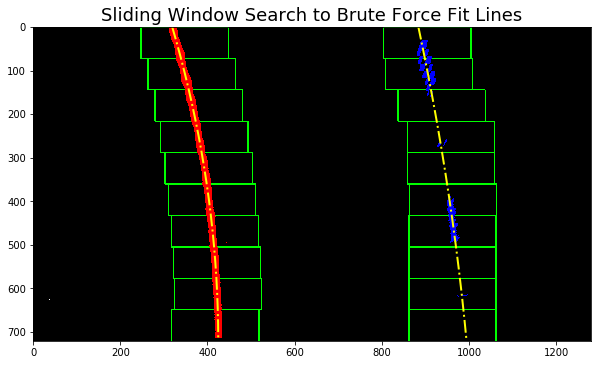

In [18]:
def sliding_window_search(binary_warped, margin=100, minpix=50, n_windows=10):
    """A brute force sliding grid search to find the lane lines 
    
    Keyword Arguments: 
    binary_warped -- A binary threshold image that has been birdeye perspective warped
    margin        -- Sets the width of the windows +/- margin
    minpix        -- Sets the minimum number of pixels found to recenter window
    n_windows     -- The number of windows in the y-direction 
    """
    window_height = np.int(binary_warped.shape[0]/n_windows)

    # Create an output image to draw on and visualize the result
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(n_windows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low, win_y_low),(win_xleft_high, win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low, win_y_low),(win_xright_high, win_y_high), (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                         (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # update lines
    left_line.update_line(leftx, lefty)
    left_fit = left_line.best_fit
    right_line.update_line(rightx, righty)
    right_fit = right_line.best_fit
    
    # annotated image 
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return left_fit, right_fit, out_img


# run the functions 
left_fit, right_fit, out_img = sliding_window_search(hist_warped)
left_fitx = left_line.create_xfit_array()
right_fitx = right_line.create_xfit_array()
ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])

# plot the image 
plt.figure(figsize=(10, 6))
plt.title('Sliding Window Search to Brute Force Fit Lines', fontsize=18)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow', lw=2, ls='dashdot')
plt.plot(right_fitx, ploty, color='yellow', lw=2, ls='dashdot')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()

<div id='section274'></div>

#### 2.7.4 Fit from the previous lane lines, this assume the lanes shouldn't change much frame to frame 

----

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

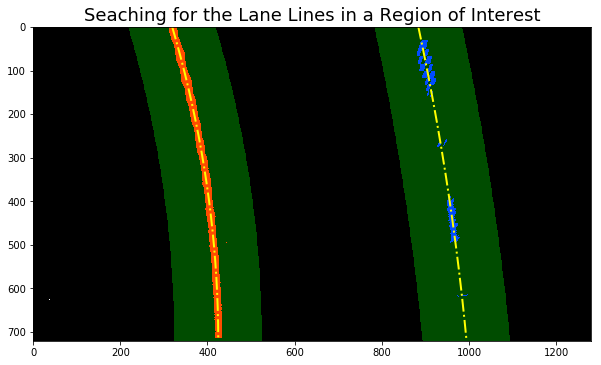

In [19]:
def fit_from_previous(binary_warped, margin=100):
    """Fit based on data from the previous fit."""
    if left_line.detected == False | right_line.detected == False:
        sliding_window_search(binary_warped)
        
    left_fit_prev = left_line.current_fit
    right_fit_prev = right_line.current_fit 
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + \
                     left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + \
                     left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + \
                      right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + \
                      right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # fitted array of x's 
    left_line.update_line(leftx, lefty)
    left_fit = left_line.best_fit
    right_line.update_line(rightx, righty)
    right_fit = right_line.best_fit


def visualize_fit_from_prev(binary_warped, left_fitx, right_fitx, margin=100):
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    left_fit_prev = left_line.current_fit
    right_fit_prev = right_line.current_fit
    
    # get nonzeros 
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + \
                     left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + \
                     left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + \
                      right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + \
                      right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin))) 
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    return left_line_pts, right_line_pts, out_img


# Draw the lane onto the warped blank image
fit_from_previous(hist_warped)
left_line_pts, right_line_pts, out_img = visualize_fit_from_prev(hist_warped, 
                                                                 left_line.create_xfit_array(), 
                                                                 right_line.create_xfit_array())
window_img = np.zeros_like(out_img)

cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure(figsize=(10, 6))
plt.title('Seaching for the Lane Lines in a Region of Interest', fontsize=18)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow', lw=2, ls='dashdot')
plt.plot(right_fitx, ploty, color='yellow', lw=2, ls='dashdot')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()

<div id="section275"></div> 

#### 2.7.5 Display Radius of Curvature and Off Center

---

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

Left: 0.81km, Right: 2.00km, Average: 1.41km

Offset Center: 0.367m


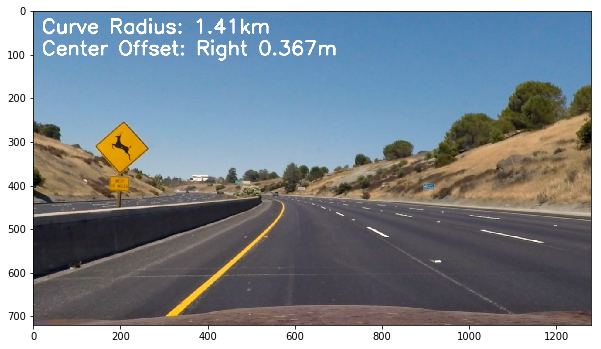

In [20]:
def draw_text_info(img, curve_rad, center_offset):
    """Draws text based lane information onto the image 
    
    Keyword Arguments: 
    img           -- Meters per Pixel in the X-direction 
    curve_rad     -- The radius of curvature of the lane lines
    center_offset -- The center offset of the car to the lane lines 
    """
    out_img = np.copy(img)
    font = cv2.FONT_HERSHEY_SIMPLEX
    color = (255, 255, 255)
    direction = ''
    if center_offset > 0:
        direction = 'Right'
    else:
        direction = 'Left'
    curve_text = 'Curve Radius: ' + '{:04.2f}'.format(curve_rad) + 'km'
    center_text = 'Center Offset: ' + direction + ' {:04.3f}'.format(abs(center_offset)) + 'm'
    cv2.putText(out_img, curve_text, (20, 50), font, 1.5, color, 3, cv2.LINE_AA)
    cv2.putText(out_img, center_text, (20, 100), font, 1.5, color, 3, cv2.LINE_AA)
    
    return out_img

# check Functions 
left_curve = left_line.calc_rad_ness()
right_curve = right_line.calc_rad_ness()
avg_curve = (right_curve + left_curve) / 2
print("Left: {:.02f}km, Right: {:.02f}km, Average: {:.02f}km".format(left_curve, right_curve, avg_curve)) 
print()
center_offset = (right_line.line_base_pos - left_line.line_base_pos) / 2
print("Offset Center: {:.03f}m".format(center_offset))

# show draw text 
plt.figure(figsize=(10, 6))
plt.imshow(draw_text_info(hist_img, avg_curve, center_offset))
plt.show()

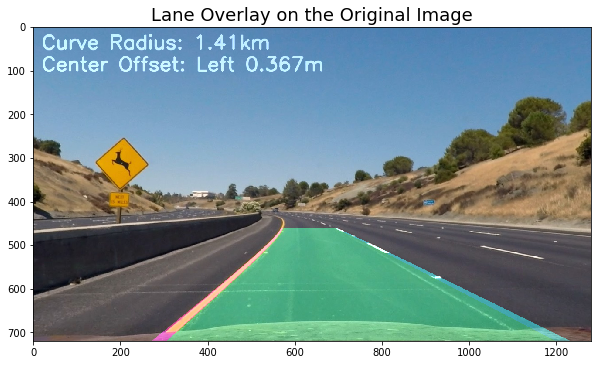

In [21]:
# Find area between the lane lines 
def draw_overlay(binary_warped):
    """Draws the lane overlay and text based information 
    
    Keyword Arguments: 
    img        -- The image to overlay 
    left_fitx  -- The x points from the left line fit
    right_fitx -- The x points from the right line fit
    """
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    n_points = len(left_line.recent_xfitted[-1])
    y_array = np.linspace(0, n_points-1, n_points)
    left = np.array(np.transpose(np.vstack([left_line.recent_xfitted[-1], y_array])))
    right = np.array(np.flipud(np.transpose(np.vstack([right_line.recent_xfitted[-1], y_array]))))
    line_points = np.vstack((left, right))
    
    # draw lane overlay 
    cv2.fillPoly(out_img, np.int_([line_points]), [0, 255, 127])
    cv2.polylines(out_img, np.int32([left]), isClosed=False, color=(255, 0, 255), thickness=20)
    cv2.polylines(out_img, np.int32([right]), isClosed=False, color=(0, 255, 255), thickness=20)

    # unwarp the polyfill(swap src and dist in birdseye warp for M_inverse)
    src, dist = get_warp_pts(out_img)
    out_img = birdseye_warp(out_img, src=dst, dst=src)
    
    # overlay text information
    curve_rad = (left_line.radius_of_curvature + right_line.radius_of_curvature) / 2
    center_offset = (left_line.line_base_pos - right_line.line_base_pos) / 2 
    out_img = draw_text_info(out_img, curve_rad, center_offset)
    
    return out_img


# overlay lane line area 
unwarp = draw_overlay(hist_warped)
result = cv2.addWeighted(hist_img, 1, unwarp, 0.4, 0)
plt.figure(figsize=(10, 6))
plt.title('Lane Overlay on the Original Image', fontsize=18)
plt.imshow(result)
plt.show()

<div id="section3"></div> 

# Section 3: Final Pipeline
---- 

* Step 1: Undistort Image using the camera matrix 
* Step 2: Threshold the Image 
* Step 3: Birdseye Warp the Image 
* Step 4: Detect Lane Lines 
* Step 5: Estimate Curvature 

---

<div style="text-align: right"><a href="#toc">[Return to TOC]</a></div>

In [22]:
# load in the camera calibration information
dist_pickle = pickle.load(open("./camera_cal/camera_calibration.p", "rb"))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']

def pipeline(img, mtx, dist, info_alpha=0.4):
    undist = undistort_image(img, mtx, dist)
    thresh = combined_thresholding(undist)
    src, dst = get_warp_pts(img)
    binary_warped = birdseye_warp(thresh, src, dst)
    fit_from_previous(binary_warped)
    lane_info = draw_overlay(binary_warped)
    result = cv2.addWeighted(img, 1, lane_info, info_alpha, 0)
    
    return result
    
output_path = 'output_videos/project_video_processed.mp4'
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(lambda x: pipeline(x, mtx, dist))
%time clip.write_videofile(output_path, audio=False)

[MoviePy] >>>> Building video output_videos/project_video_processed.mp4
[MoviePy] Writing video output_videos/project_video_processed.mp4


100%|█████████▉| 1260/1261 [04:10<00:00,  5.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_processed.mp4 

CPU times: user 4min, sys: 58.2 s, total: 4min 58s
Wall time: 4min 12s


### Challenge Vidoes are currently ------> BROKEN :( 

In [23]:
output_path = 'output_videos/challenge_video_processed.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
clip = clip1.fl_image(lambda x: pipeline(x, mtx, dist))
%time clip.write_videofile(output_path, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_video_processed.mp4
[MoviePy] Writing video output_videos/challenge_video_processed.mp4


100%|██████████| 485/485 [01:28<00:00,  5.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video_processed.mp4 

CPU times: user 1min 30s, sys: 16 s, total: 1min 46s
Wall time: 1min 30s


In [ ]:
output_path = 'output_videos/harder_challenge_video_processed.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
clip = clip1.fl_image(lambda x: pipeline(x, mtx, dist))
%time clip.write_videofile(output_path, audio=False)